# Synthetic signal Generation
_Synthetic wave generation and mixing, along with synthetic noise mixing_

In [65]:
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('ggplot')

import librosa.display as display
import scipy.io.wavfile as wav
from scipy.fft import fft, fftfreq
import IPython.display

import sys
sys.path.insert(1, '../modules/')
from make_wave import MakeWave
from utils import Features, NoiseGen
from padding import Padding

## 1. Wave Generation 

In [2]:
sr = 44100.

waves = {'sine':[], 'square':[], 'saw':[]} # Independent sound waves
wave_keys = list(waves.keys())

for i in range(1000):
    wave_generator = MakeWave(duration=np.random.uniform(2., 8.), sample_rate=sr) 
    sine_wave = wave_generator.sine_wave(np.random.uniform(0., sr/2), np.random.uniform(-60., 1.))
    waves['sine'].append(sine_wave)
    wave_generator = MakeWave(duration=np.random.uniform(1., 10.), sample_rate=sr)
    square_wave = wave_generator.square_wave(np.random.uniform(0., sr/2), np.random.uniform(-60., 1.))
    waves['square'].append(square_wave)
    wave_generator = MakeWave(duration=np.random.uniform(1., 10.), sample_rate=sr)
    saw_wave = wave_generator.saw_wave(np.random.uniform(0., sr/2), np.random.uniform(-60., 1.))
    waves['saw'].append(saw_wave)
    

/Users/sonic_tertul/Documents/side_projs/source_separation/notebooks/../modules/make_wave.py:37: RuntimeWarning: divide by zero encountered in divide
  saw_wv = amp * (-2/np.pi) * np.arctan(1/np.tan(np.pi * frequency * self.t))


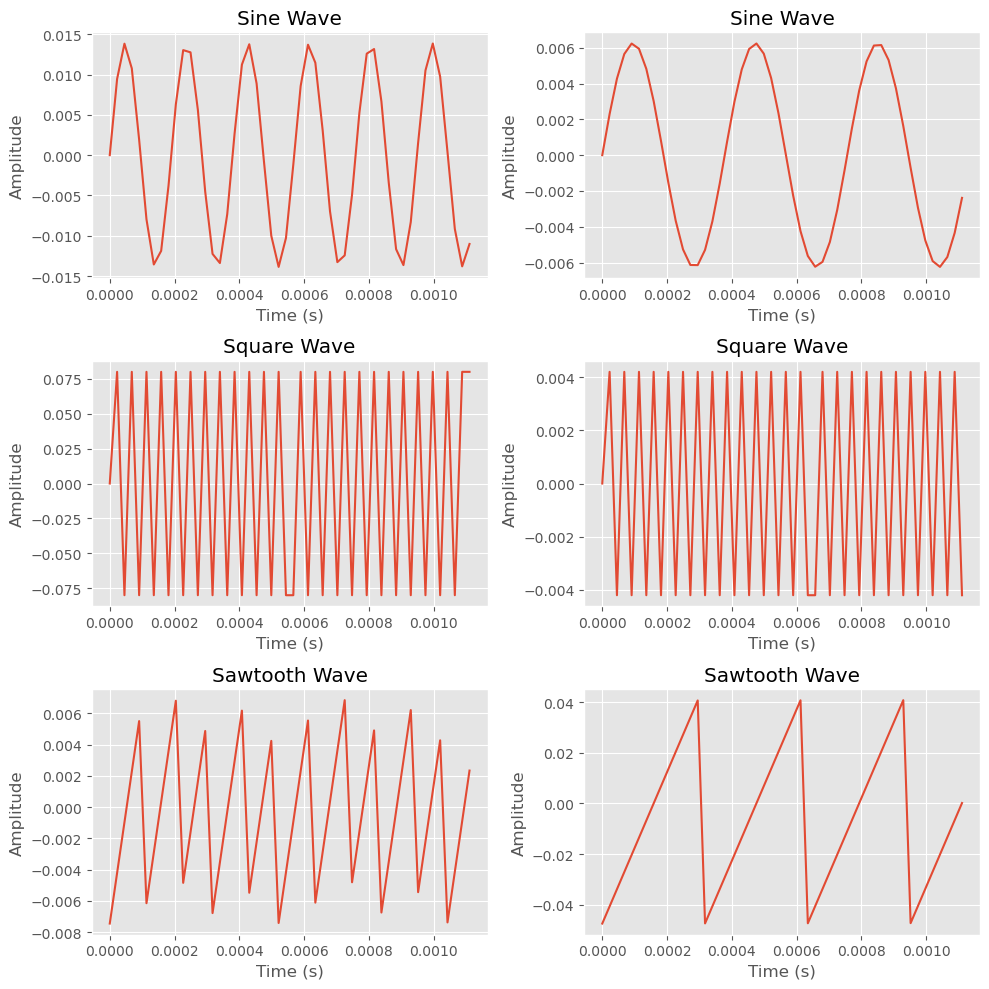

In [3]:
# Subplots of sine, square, sawtooth and mixed signals
fig, ax = plt.subplots(3,2, figsize=(10,10))

ax[0,0].plot(wave_generator.t[0:50], waves['sine'][0][0:50])
ax[0,0].set_title('Sine Wave')
ax[0,0].set_xlabel('Time (s)')
ax[0,0].set_ylabel('Amplitude')

ax[0,1].plot(wave_generator.t[0:50], waves['sine'][1][0:50])
ax[0,1].set_title('Sine Wave')
ax[0,1].set_xlabel('Time (s)')
ax[0,1].set_ylabel('Amplitude')

ax[1,0].plot(wave_generator.t[0:50], waves['square'][0][0:50])
ax[1,0].set_title('Square Wave')
ax[1,0].set_xlabel('Time (s)')
ax[1,0].set_ylabel('Amplitude')

ax[1,1].plot(wave_generator.t[0:50], waves['square'][1][0:50])
ax[1,1].set_title('Square Wave')
ax[1,1].set_xlabel('Time (s)')
ax[1,1].set_ylabel('Amplitude')

ax[2,0].plot(wave_generator.t[0:50], waves['saw'][0][0:50])
ax[2,0].set_title('Sawtooth Wave')
ax[2,0].set_xlabel('Time (s)')
ax[2,0].set_ylabel('Amplitude')

ax[2,1].plot(wave_generator.t[0:50], waves['saw'][1][0:50])
ax[2,1].set_title('Sawtooth Wave')
ax[2,1].set_xlabel('Time (s)')
ax[2,1].set_ylabel('Amplitude')

plt.tight_layout()

In [4]:
# Sample signals as Audio
IPython.display.display(IPython.display.Audio(waves['sine'][0], rate=sr))
IPython.display.display(IPython.display.Audio(waves['sine'][1], rate=sr))
IPython.display.display(IPython.display.Audio(waves['square'][0], rate=sr))
IPython.display.display(IPython.display.Audio(waves['square'][1], rate=sr))
IPython.display.display(IPython.display.Audio(waves['saw'][0], rate=sr))
IPython.display.display(IPython.display.Audio(waves['saw'][1], rate=sr))

# 2. Signal Mixtures

### 40 mixed signals each with 5 waves per wave type. Mixture signals will be 10 seconds.

> 1. Define Padding module for padding waves < 10s and new dictionary for padded waves
2. Pad Signals based on current number of samples (if possible pad both front and back) if not, pad back
3. Mix signal 



In [5]:
# Padded waves
new_waves = {'sine':[],
             'square':[],
             'saw':[]}
duration = 10.
Pad = Padding(sr, duration)

### Define Padding Function
> 1. Compare the number of samples needed for 10s (441000) to the length of the input wave
2. If needed samples / 2 leaves a remainder of 0, split the padding between beginning and end, otherwise, pad back
3. List of new waves to new_waves dictionary


In [6]:
def pad_signal(waves : list, back=True):
    
    padded_waves = []
    for w in range(len(waves)):
        wave = waves[w]
        if ((sr * duration) - len(wave)) % 2 == 0:
            n_wave = Pad.pad_both(wave)
            padded_waves.append(n_wave)
        elif back == True:
            n_wave = Pad.pad_back(wave)
            padded_waves.append(n_wave)
        elif back == False:
            n_wave = Pad.pad_front(wave)
            padded_waves.append(n_wave)
            
    return padded_waves

In [7]:
# Pad Waves
new_waves['sine'] = pad_signal(waves['sine'])
new_waves['square'] = pad_signal(waves['square'])
new_waves['saw'] = pad_signal(waves['saw'])
len(new_waves['sine'])

1000

### Mix waves to create mixture signals
> 1. Stack 25 waves from each wave type, and sum their columns
2. Repeat 40 times resulting in 40 mixtures with 75 waves each

In [8]:
mixtures = []
start = 0
end = 25
for s in range(40):
    # Lists of waves as a 1D array of signals mixed
    sines = np.sum(np.stack(new_waves['sine'][start:end]), axis=0)   
    squares = np.sum(np.stack(new_waves['square'][start:end]), axis=0)
    saws = np.sum(np.stack(new_waves['saw'][start:end]), axis=0)
    mixtures.append(sines + squares +saws)
    start += 5 
    end += 5

In [9]:
# Sample mixtures as Audio
IPython.display.display(IPython.display.Audio(mixtures[0], rate=sr))
IPython.display.display(IPython.display.Audio(mixtures[1], rate=sr))
IPython.display.display(IPython.display.Audio(mixtures[2], rate=sr))
IPython.display.display(IPython.display.Audio(mixtures[3], rate=sr))
IPython.display.display(IPython.display.Audio(mixtures[4], rate=sr))
IPython.display.display(IPython.display.Audio(mixtures[5], rate=sr))

# 3. Noise generation added to mixture signals
> Create new mixtures with white noise added to the signal.

In [83]:
mix_noise = []
for m in range(len(mixtures)):
    mix_noise.append(NoiseGen.white(mixtures[m]))

In [84]:
# Sample mixtures as Audio
IPython.display.display(IPython.display.Audio(mix_noise[0], rate=sr))
IPython.display.display(IPython.display.Audio(mix_noise[1], rate=sr))
IPython.display.display(IPython.display.Audio(mix_noise[2], rate=sr))
IPython.display.display(IPython.display.Audio(mix_noise[3], rate=sr))
IPython.display.display(IPython.display.Audio(mix_noise[4], rate=sr))
IPython.display.display(IPython.display.Audio(mix_noise[5], rate=sr))

In [85]:
# Compute Log-Mel Spectrograms for noise mixtures
mel_spect = []

for m in range(40):
    spec = Features.mel_spec(
        mix_noise[m], sr=int(sr), 
        mels=128, win_len=1024,
        n_fft=1024, log=True
        )
    
    mel_spect.append(spec)

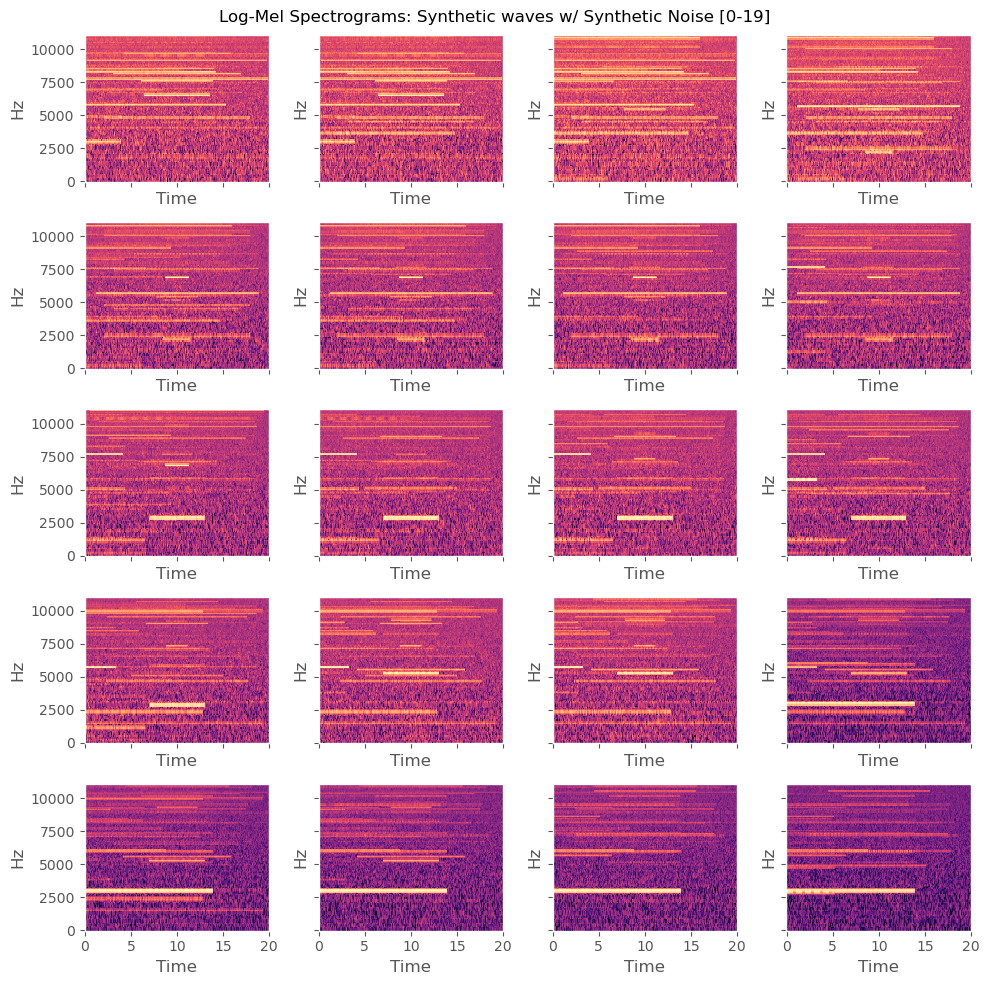

In [86]:
fig, ax = plt.subplots(5,4, figsize=(10,10), sharex=True, sharey=True)

img = display.specshow(mel_spect[0], x_axis='time', y_axis='hz', ax=ax[0,0])
display.specshow(mel_spect[1], x_axis='time', y_axis='hz', ax=ax[0,1])
display.specshow(mel_spect[2], x_axis='time', y_axis='hz', ax=ax[0,2])
display.specshow(mel_spect[3], x_axis='time', y_axis='hz', ax=ax[0,3])
display.specshow(mel_spect[4], x_axis='time', y_axis='hz', ax=ax[1,0])
display.specshow(mel_spect[5], x_axis='time', y_axis='hz', ax=ax[1,1])
display.specshow(mel_spect[6], x_axis='time', y_axis='hz', ax=ax[1,2])
display.specshow(mel_spect[7], x_axis='time', y_axis='hz', ax=ax[1,3])
display.specshow(mel_spect[8], x_axis='time', y_axis='hz', ax=ax[2,0])
display.specshow(mel_spect[9], x_axis='time', y_axis='hz', ax=ax[2,1])
display.specshow(mel_spect[10], x_axis='time', y_axis='hz', ax=ax[2,2])
display.specshow(mel_spect[11], x_axis='time', y_axis='hz', ax=ax[2,3])
display.specshow(mel_spect[12], x_axis='time', y_axis='hz', ax=ax[3,0])
display.specshow(mel_spect[13], x_axis='time', y_axis='hz', ax=ax[3,1])
display.specshow(mel_spect[14], x_axis='time', y_axis='hz', ax=ax[3,2])
display.specshow(mel_spect[15], x_axis='time', y_axis='hz', ax=ax[3,3])
display.specshow(mel_spect[16], x_axis='time', y_axis='hz', ax=ax[4,0])
display.specshow(mel_spect[17], x_axis='time', y_axis='hz', ax=ax[4,1])
display.specshow(mel_spect[18], x_axis='time', y_axis='hz', ax=ax[4,2])
display.specshow(mel_spect[19], x_axis='time', y_axis='hz', ax=ax[4,3])


plt.suptitle('Log-Mel Spectrograms: Synthetic waves w/ Synthetic Noise [0-19]')
plt.tight_layout()

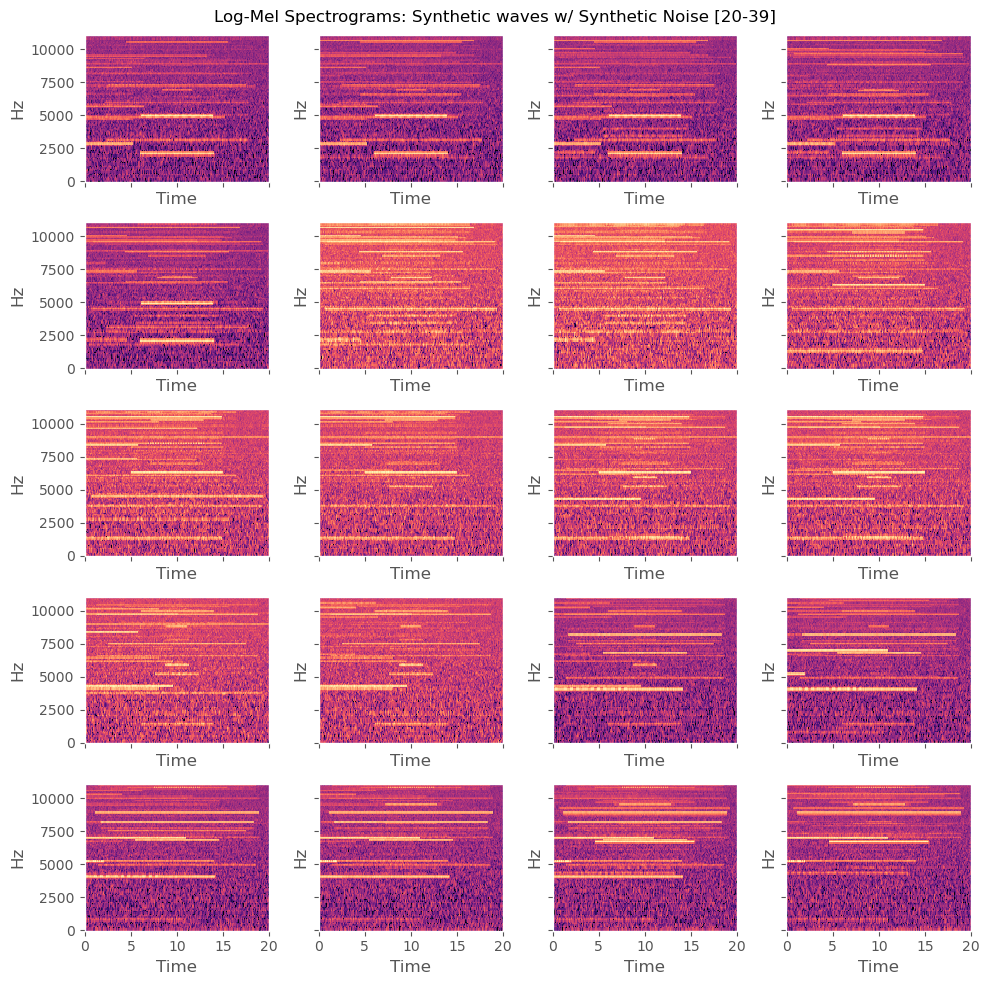

In [87]:
fig, ax = plt.subplots(5,4, figsize=(10,10), sharex=True, sharey=True)

img = display.specshow(mel_spect[20], x_axis='time', y_axis='hz', ax=ax[0,0])
display.specshow(mel_spect[21], x_axis='time', y_axis='hz', ax=ax[0,1])
display.specshow(mel_spect[22], x_axis='time', y_axis='hz', ax=ax[0,2])
display.specshow(mel_spect[23], x_axis='time', y_axis='hz', ax=ax[0,3])
display.specshow(mel_spect[24], x_axis='time', y_axis='hz', ax=ax[1,0])
display.specshow(mel_spect[25], x_axis='time', y_axis='hz', ax=ax[1,1])
display.specshow(mel_spect[26], x_axis='time', y_axis='hz', ax=ax[1,2])
display.specshow(mel_spect[27], x_axis='time', y_axis='hz', ax=ax[1,3])
display.specshow(mel_spect[28], x_axis='time', y_axis='hz', ax=ax[2,0])
display.specshow(mel_spect[29], x_axis='time', y_axis='hz', ax=ax[2,1])
display.specshow(mel_spect[31], x_axis='time', y_axis='hz', ax=ax[2,2])
display.specshow(mel_spect[31], x_axis='time', y_axis='hz', ax=ax[2,3])
display.specshow(mel_spect[32], x_axis='time', y_axis='hz', ax=ax[3,0])
display.specshow(mel_spect[33], x_axis='time', y_axis='hz', ax=ax[3,1])
display.specshow(mel_spect[34], x_axis='time', y_axis='hz', ax=ax[3,2])
display.specshow(mel_spect[35], x_axis='time', y_axis='hz', ax=ax[3,3])
display.specshow(mel_spect[36], x_axis='time', y_axis='hz', ax=ax[4,0])
display.specshow(mel_spect[37], x_axis='time', y_axis='hz', ax=ax[4,1])
display.specshow(mel_spect[38], x_axis='time', y_axis='hz', ax=ax[4,2])
display.specshow(mel_spect[39], x_axis='time', y_axis='hz', ax=ax[4,3])


plt.suptitle('Log-Mel Spectrograms: Synthetic waves w/ Synthetic Noise [20-39]')
plt.tight_layout()

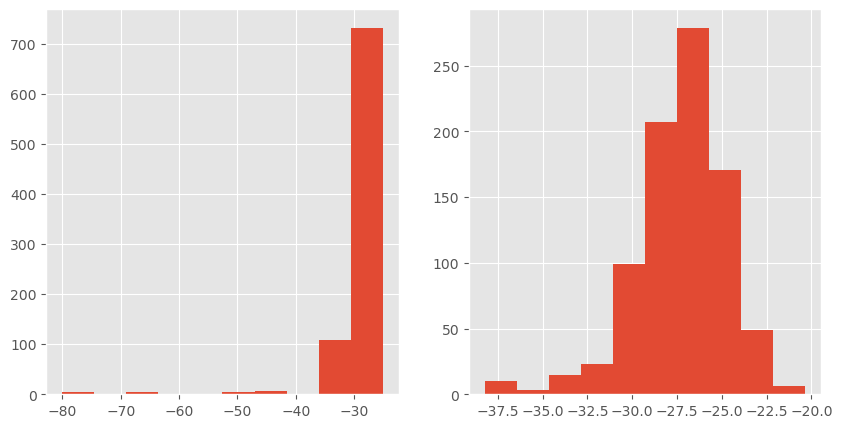

In [92]:
clean_spec = Features.mel_spec(
    mixtures[0], sr=int(sr),
    mels=128, win_len=1024,
    n_fft=1024, log=True
)
fig, ax = plt.subplots(1,2, figsize=(10,5))

ax[0].hist(clean_spec[-1])
ax[1].hist(mel_spect[0][-1])

plt.show()